In [33]:
import pandas as pd

df = pd.read_csv(r"C:\Users\ethan\OneDrive\Desktop\elon_musk_tweets.csv")

df.head()


,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
0,1544379368478212100,Elon Musk,NaN,"Mars & Cars, Chips & Dips",2009-06-02 20:12:29+00:00,101240855,115,13503,True,2022-07-05 17:55:09+00:00,@BillyM2k I find the gold toe sock – inevitabl...,NaN,Twitter for iPhone,335,6542,False
1,1544377493263720450,Elon Musk,NaN,"Mars & Cars, Chips & Dips",2009-06-02 20:12:29+00:00,101240806,115,13503,True,2022-07-05 17:47:42+00:00,"Sock Con, the conference for socks",NaN,Twitter for iPhone,1451,30753,False
2,1544377130590552064,Elon Musk,NaN,"Mars & Cars, Chips & Dips",2009-06-02 20:12:29+00:00,101240806,115,13503,True,2022-07-05 17:46:15+00:00,Always something new for the magazine cover an...,NaN,Twitter for iPhone,1284,28610,False
3,1544375575724400645,Elon Musk,NaN,"Mars & Cars, Chips & Dips",2009-06-02 20:12:29+00:00,101240806,115,13503,True,2022-07-05 17:40:05+00:00,@ExplainThisBob This guy gets it,NaN,Twitter for iPhone,131,3640,False
4,1544375148605853699,Elon Musk,NaN,"Mars & Cars, Chips & Dips",2009-06-02 20:12:29+00:00,101240806,115,13503,True,2022-07-05 17:38:23+00:00,Sock tech is so advanced that you can get pret...,NaN,Twitter for iPhone,1191,23790,False


In [34]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ethan\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ethan\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\ethan\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [35]:
#testing how the utf 8 works
import html

text = "@BillyM2k I find the gold toe sock â€“ inevitably off kilter &amp; washed out â€“ a little troubling esthetically &amp; arguably a bit corpo"

text_cleaned = html.unescape(text)

text_cleaned = text_cleaned.replace("â€“", "–").replace("amp;", "&")

print(text_cleaned)


@BillyM2k I find the gold toe sock – inevitably off kilter & washed out – a little troubling esthetically & arguably a bit corpo


In [36]:
import pandas as pd
import re
import nltk
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk import pos_tag

# Duplicate the original dataframe to work with
tweets_data = df.copy()

# Create a column for the original tweet and convert 'date' to datetime
tweets_data['original_tweet'] = df['text']
tweets_data['datetime'] = pd.to_datetime(tweets_data['date'], errors='coerce')

# Remove timezone information from datetime
tweets_data['datetime'] = tweets_data['datetime'].dt.tz_localize(None)

# Flag retweets (tweets starting with "RT @")
is_retweet = tweets_data['text'].apply(lambda tweet: tweet.startswith("RT @"))

# Standard text preprocessing (Case folding)
tweets_data['text'] = tweets_data['text'].apply(lambda tweet: tweet.lower())  # Convert text to lowercase

# Eliminate Twitter mentions (e.g., @username)
tweets_data['text'] = tweets_data['text'].apply(lambda tweet: re.sub(r'@\S+', '', tweet))

# Remove hashtags (e.g., #hashtag)
tweets_data['text'] = tweets_data['text'].apply(lambda tweet: re.sub(r'#\S+', '', tweet))

# Erase URLs (e.g., http://link.com)
tweets_data['text'] = tweets_data['text'].apply(lambda tweet: re.sub(r'http\S+', '', tweet))

# Decode HTML entities like &amp; to & and fix other special characters
tweets_data['text'] = tweets_data['text'].apply(lambda tweet: html.unescape(tweet))

# Fix encoding issues (like â€“ to –) and problematic characters
tweets_data['text'] = tweets_data['text'].apply(lambda tweet: tweet.replace("â€“", "–").replace("â€˜", "'").replace("â€™", "'").replace("â€œ", '"').replace("â€", '"').replace("amp;", "&"))

# Remove all punctuation, including possessive 's and other special characters
# tweets_data['text'] = tweets_data['text'].apply(lambda tweet: re.sub(r'[^\w\s]', '', tweet))  # Remove punctuation

# Ensure whitespace is correctly preserved
tweets_data['text'] = tweets_data['text'].apply(lambda tweet: re.sub(r'\s+', ' ', tweet))  # Replace multiple spaces with a single space

# Remove single-letter words (e.g., 'a', 'I')
tweets_data['text'] = tweets_data['text'].apply(lambda tweet: re.sub(r'\s+[a-zA-Z]\s+', ' ', tweet))

# Ensure leading/trailing spaces are removed
tweets_data['text'] = tweets_data['text'].apply(lambda tweet: tweet.strip())

# Preview the cleaned-up dataset
tweets_data.head()


,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet,original_tweet,datetime
0,1544379368478212100,Elon Musk,NaN,"Mars & Cars, Chips & Dips",2009-06-02 20:12:29+00:00,101240855,115,13503,True,2022-07-05 17:55:09+00:00,find the gold toe sock – inevitably off kilter...,NaN,Twitter for iPhone,335,6542,False,@BillyM2k I find the gold toe sock – inevitabl...,2022-07-05 17:55:09
1,1544377493263720450,Elon Musk,NaN,"Mars & Cars, Chips & Dips",2009-06-02 20:12:29+00:00,101240806,115,13503,True,2022-07-05 17:47:42+00:00,"sock con, the conference for socks",NaN,Twitter for iPhone,1451,30753,False,"Sock Con, the conference for socks",2022-07-05 17:47:42
2,1544377130590552064,Elon Musk,NaN,"Mars & Cars, Chips & Dips",2009-06-02 20:12:29+00:00,101240806,115,13503,True,2022-07-05 17:46:15+00:00,always something new for the magazine cover an...,NaN,Twitter for iPhone,1284,28610,False,Always something new for the magazine cover an...,2022-07-05 17:46:15
3,1544375575724400645,Elon Musk,NaN,"Mars & Cars, Chips & Dips",2009-06-02 20:12:29+00:00,101240806,115,13503,True,2022-07-05 17:40:05+00:00,this guy gets it,NaN,Twitter for iPhone,131,3640,False,@ExplainThisBob This guy gets it,2022-07-05 17:40:05
4,1544375148605853699,Elon Musk,NaN,"Mars & Cars, Chips & Dips",2009-06-02 20:12:29+00:00,101240806,115,13503,True,2022-07-05 17:38:23+00:00,sock tech is so advanced that you can get pret...,NaN,Twitter for iPhone,1191,23790,False,Sock tech is so advanced that you can get pret...,2022-07-05 17:38:23


In [37]:
# Sentence Segmentation
tweets_data['text'] = tweets_data['text'].apply(lambda tweet: tweet.replace('\n\n', '. '))
tweets_data['text'] = tweets_data['text'].apply(lambda tweet: tweet.replace('\n', '. '))
tweets_data['sentence_segments'] = tweets_data['text'].apply(lambda tweet: sent_tokenize(tweet))


In [38]:
# Punctuation removal
tweets_data['text'] = tweets_data['text'].apply(lambda tweet: re.sub(r'[^\w\s]', '', tweet))  # Remove punctuation

In [39]:
# tokenization
tweets_data['tokens'] = tweets_data['text'].apply(lambda tweet: word_tokenize(tweet))

In [40]:
# Stop Word Removal
stop_words = set(stopwords.words('english'))
tweets_data['tokens_no_stopwords'] = tweets_data['tokens'].apply(lambda tokens: [word for word in tokens if word not in stop_words])

for w in stop_words:
    if w not in stop_words:
        tweets_data.append(w)
 
print(stop_words)
print(tweets_data['tokens_no_stopwords'])

{'being', 'have', 'their', 'here', 'own', "wouldn't", 'needn', 'as', 'only', "we're", 'doing', 'having', 'nor', 'not', "they'll", 'there', 'do', 'myself', 'into', 'over', 'that', "she's", 'wouldn', "they've", 'now', 'further', 'what', 'under', 'y', 'd', 'down', 'then', "you'd", 'ain', 'should', 'mustn', 'wasn', 'the', 'few', 'am', 'once', 'me', "we've", 'because', 'haven', 'she', 'ours', "you're", 'hers', 'm', 'ma', 'weren', 'until', "i'd", 'shouldn', 'yourselves', 'in', "hadn't", 'again', "they're", "didn't", 'up', "we'd", 'our', 'very', 'them', 'of', 'through', 'against', "he'll", "should've", 'after', 'herself', 'its', "couldn't", 'a', 'all', 'i', 'where', 'his', "mustn't", 'by', "you've", 'why', 'about', "hasn't", "she'd", 'hasn', 'been', "she'll", "wasn't", 'below', "i'll", 'yourself', "they'd", "we'll", 'off', "shan't", 'those', 'this', 'when', 'my', 'but', 'doesn', 'other', 'are', 'had', 'on', "mightn't", "haven't", 'whom', "weren't", 'can', 'no', 'will', 'at', 'didn', 'themselv

In [41]:
# abbreviation handling
abbreviations = {"u": "you", "r": "are", "b4": "before", "gr8": "great"}  # Add more as necessary
tweets_data['tokens_abbrev_handled'] = tweets_data['tokens'].apply(lambda tokens: [abbreviations.get(word, word) for word in tokens])

In [42]:
# Stemming
stemmer = PorterStemmer()
tweets_data['tokens_stemmed'] = tweets_data['tokens'].apply(lambda tokens: [stemmer.stem(word) for word in tokens])

In [43]:
# pos tag
tweets_data['pos_tags'] = tweets_data['tokens'].apply(lambda tokens: pos_tag(tokens))

In [44]:
# Save the cleaned data to a new CSV file with UTF-8 encoding
# tweets_data.to_csv("elon_musk_tweets_processed.csv", index=False, encoding='utf-8')

print(tweets_data[[
    'original_tweet',
    'sentence_segments',
    'tokens',
    # 'tokens_casefolded',
    'text',
    'tokens_no_stopwords',
    'tokens_abbrev_handled',
    'tokens_stemmed',
    # 'tokens_lemmatized',
    # 'lemmatized_tokens_spacy',
    'pos_tags'
]].to_string(index=False))


                                                                                                                                          original_tweet                                                                                                                            sentence_segments                                                                                                                                                          tokens                                                                                                                                     text                                                                                                                   tokens_no_stopwords                                                                                                                                           tokens_abbrev_handled                                                                                                                    

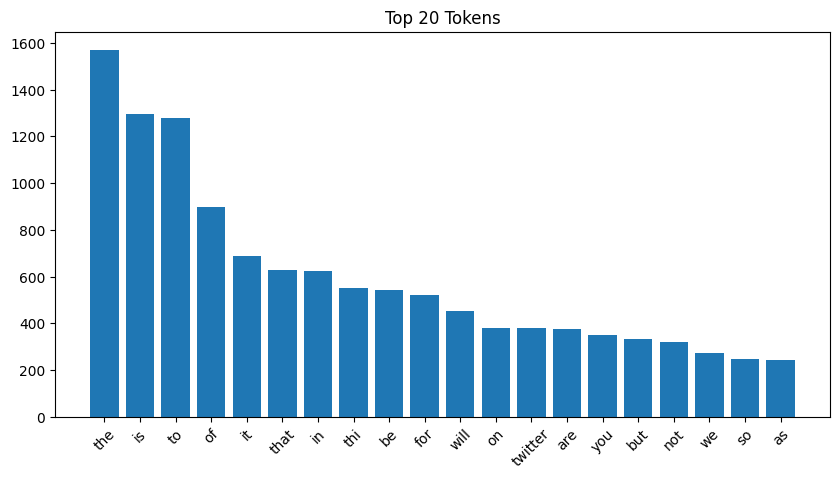

In [45]:
# top tokens frequency
from collections import Counter
import matplotlib.pyplot as plt

all_tokens = [token for sublist in tweets_data['tokens_stemmed'] for token in sublist]
top_tokens = Counter(all_tokens).most_common(20)

tokens, freqs = zip(*top_tokens)
plt.figure(figsize=(10,5))
plt.bar(tokens, freqs)
plt.title("Top 20 Tokens")
plt.xticks(rotation=45)
plt.show()


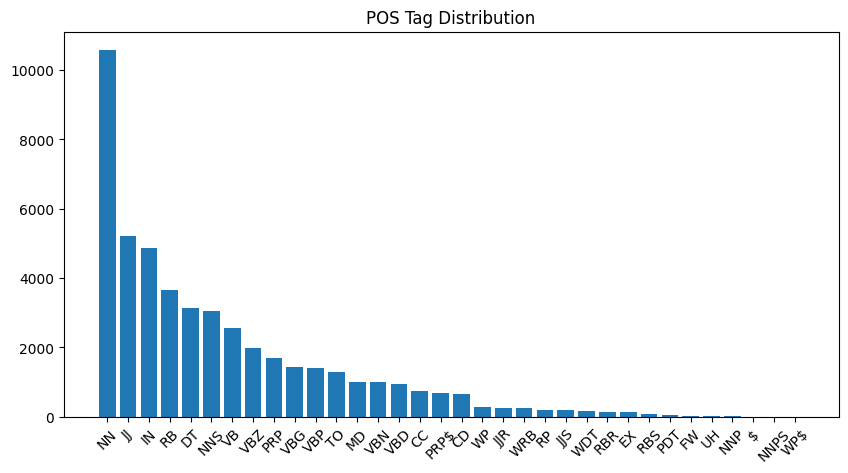

In [46]:
# pos tag distribution
all_pos = [tag for sublist in tweets_data['pos_tags'] for (_, tag) in sublist]
pos_freq = Counter(all_pos).most_common()

pos_tags, freqs = zip(*pos_freq)
plt.figure(figsize=(10,5))
plt.bar(pos_tags, freqs)
plt.title("POS Tag Distribution")
plt.xticks(rotation=45)
plt.show()


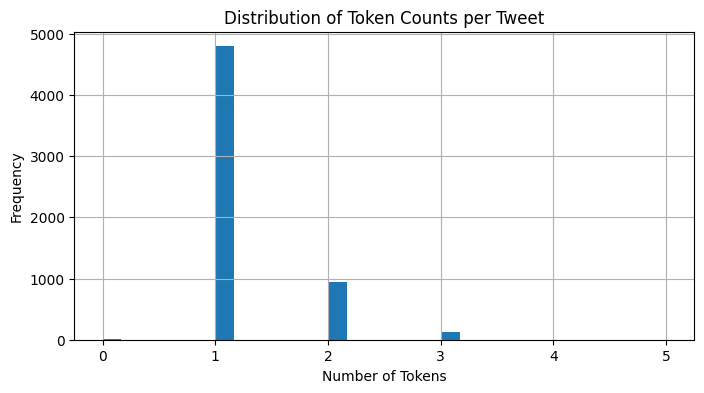

In [47]:
# sentence distribution
sentence_lengths = tweets_data['sentence_segments'].apply(len)
sentence_lengths.hist(bins=30, figsize=(8,4))
plt.title("Distribution of Token Counts per Tweet")
plt.xlabel("Number of Tokens")
plt.ylabel("Frequency")
plt.show()


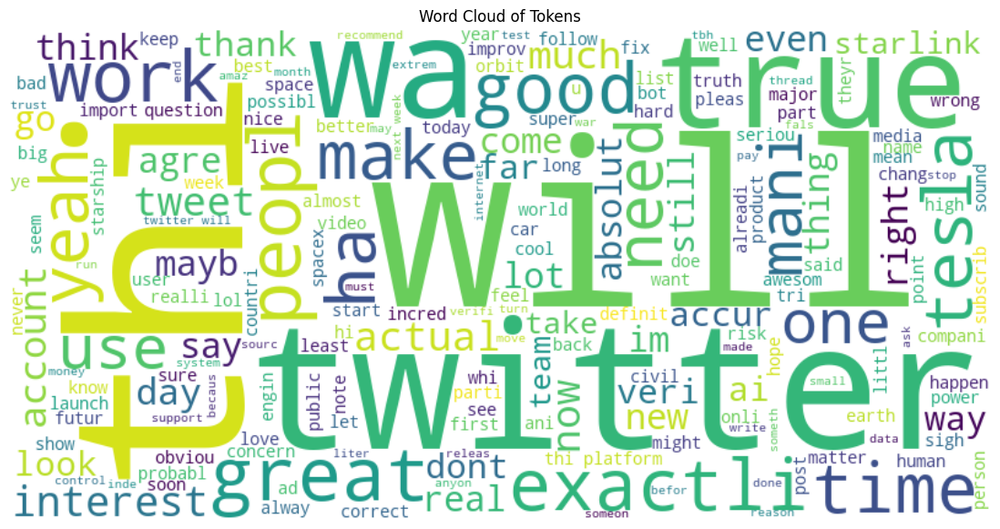

In [48]:
# word cloud
from wordcloud import WordCloud

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(all_tokens))
plt.figure(figsize=(15, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Word Cloud of Tokens")
plt.show()


In [49]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Download VADER lexicon 
nltk.download('vader_lexicon')

# Initialisation
sia = SentimentIntensityAnalyzer()

# Function to get sentiment
def get_sentiment(tweet):
    score = sia.polarity_scores(tweet)
    compound_score = score['compound']  # Compound score ranges from -1 (negative) to 1 (positive)
    
    if compound_score >= 0.05:
        return 'positive'
    elif compound_score <= -0.05:
        return 'negative'
    else:
        return 'neutral'

# Apply sentiment analysis to each tweet
tweets_data['sentiment'] = tweets_data['text'].apply(get_sentiment)

# Check the sentiment results
print(tweets_data[['text', 'sentiment']].to_string())


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\ethan\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


                                                                                                                                          text sentiment
0                                 find the gold toe sock  inevitably off kilter  washed out  little troubling esthetically  arguably bit corpo  negative
1                                                                                                            sock con the conference for socks   neutral
2                                                    always something new for the magazine cover and the articles practically write themselves   neutral
3                                                                                                                             this guy gets it   neutral
4                                                       sock tech is so advanced that you can get pretty much anything in sock form these days  positive
5                                                                                 

In [50]:
# from transformers import pipeline

# # Load sentiment pipeline
# sentiment_model = pipeline("sentiment-analysis", model="cardiffnlp/twitter-roberta-base-sentiment")

# # Run it on your sentence
# result = sentiment_model("Humanity will reach Mars in your lifetime")
# print(result)


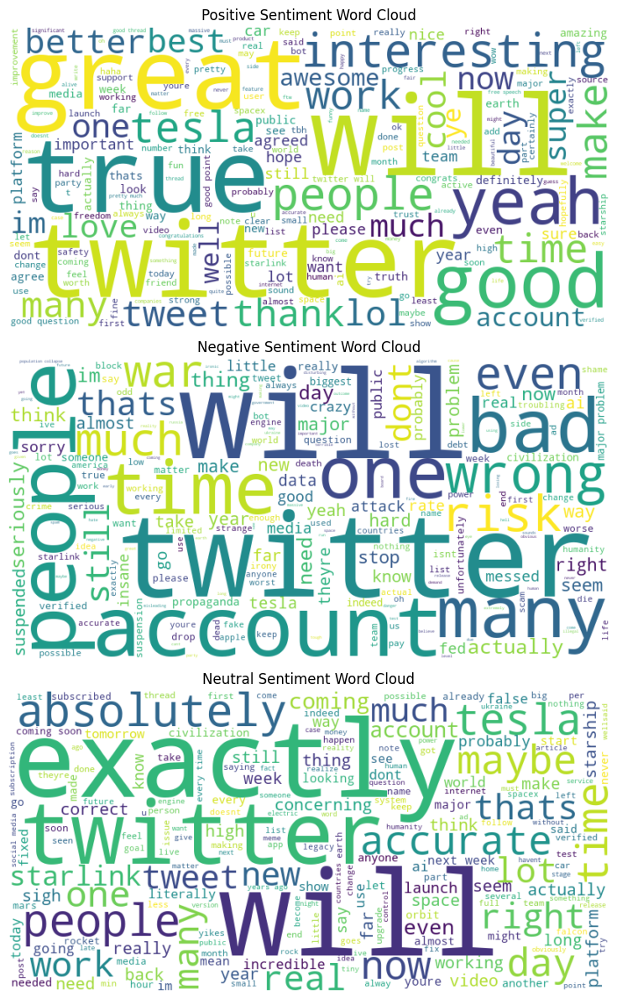

In [51]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Separate the tweets by sentiment
positive_tweets = tweets_data[tweets_data['sentiment'] == 'positive']['text']
negative_tweets = tweets_data[tweets_data['sentiment'] == 'negative']['text']
neutral_tweets = tweets_data[tweets_data['sentiment'] == 'neutral']['text']

# Combine all positive tweets into a single string
positive_text = ' '.join(positive_tweets)
negative_text = ' '.join(negative_tweets)
neutral_text = ' '.join(neutral_tweets)

# Generate Word Clouds for each sentiment
positive_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(positive_text)
negative_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(negative_text)
neutral_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(neutral_text)

# Plot the Word Clouds
plt.figure(figsize=(12, 12))

# Positive word cloud
plt.subplot(3, 1, 1)
plt.imshow(positive_wordcloud, interpolation='bilinear')
plt.title('Positive Sentiment Word Cloud')
plt.axis('off')

# Negative word cloud
plt.subplot(3, 1, 2)
plt.imshow(negative_wordcloud, interpolation='bilinear')
plt.title('Negative Sentiment Word Cloud')
plt.axis('off')

# Neutral word cloud
plt.subplot(3, 1, 3)
plt.imshow(neutral_wordcloud, interpolation='bilinear')
plt.title('Neutral Sentiment Word Cloud')
plt.axis('off')

# Show the plots
plt.tight_layout()
plt.show()


In [52]:
# NAMED ENTITY RECOGNITION 
import spacy

# Load spaCy's English model
nlp = spacy.load('en_core_web_sm')

# Apply NER on each tweet
def extract_entities(tweet):
    doc = nlp(tweet)
    return [(ent.text, ent.label_) for ent in doc.ents]

tweets_data['named_entities'] = tweets_data['text'].apply(extract_entities)

# Example printout
print(tweets_data[['text', 'named_entities']].head().to_string(index=False))


                                                                                                        text       named_entities
find the gold toe sock  inevitably off kilter  washed out  little troubling esthetically  arguably bit corpo                   []
                                                                           sock con the conference for socks                   []
                   always something new for the magazine cover and the articles practically write themselves                   []
                                                                                            this guy gets it                   []
                      sock tech is so advanced that you can get pretty much anything in sock form these days [(these days, DATE)]


In [53]:
# WORD SENSE DISAMBIGUATION
from nltk.wsd import lesk

# Example function to get sense of the first word (demo)
def disambiguate_first_word(tokens):
    if len(tokens) >= 2:
        sense = lesk(tokens, tokens[1])
        if sense:
            return sense.definition()
    return None

tweets_data['first_word_sense'] = tweets_data['tokens'].apply(disambiguate_first_word)

print(tweets_data[['tokens', 'first_word_sense']].head().to_string(index=False))


                                                                                                                   tokens                                                          first_word_sense
[find, the, gold, toe, sock, inevitably, off, kilter, washed, out, little, troubling, esthetically, arguably, bit, corpo]                                                                      None
                                                                                 [sock, con, the, conference, for, socks]                                                      deprive of by deceit
                  [always, something, new, for, the, magazine, cover, and, the, articles, practically, write, themselves]                                                                      None
                                                                                                    [this, guy, gets, it]                                steady or support with a guy wire or cable
                 [so

In [54]:
# SENTENCE SENTIMENT CLASSIFICATION 
def sentence_sentiment(sentences):
    sentiments = []
    for sentence in sentences:
        score = sia.polarity_scores(sentence)
        sentiments.append({'sentence': sentence, 'compound': score['compound']})
    return sentiments

tweets_data['sentence_sentiments'] = tweets_data['sentence_segments'].apply(sentence_sentiment)

print(tweets_data[['sentence_segments', 'sentence_sentiments']].head().to_string(index=False))


                                                                                                 sentence_segments                                                                                                                                     sentence_sentiments
[find the gold toe sock – inevitably off kilter & washed out – little troubling esthetically & arguably bit corpo] [{'sentence': 'find the gold toe sock – inevitably off kilter & washed out – little troubling esthetically & arguably bit corpo', 'compound': -0.6051}]
                                                                              [sock con, the conference for socks]                                                                                   [{'sentence': 'sock con, the conference for socks', 'compound': 0.0}]
                       [always something new for the magazine cover and the articles practically write themselves]                            [{'sentence': 'always something new for the magazine cove

In [55]:
# SENTIMENT LEXICON
# Load VADER lexicon dictionary
vader_lexicon = sia.lexicon

def extract_sentiment_words(tokens):
    pos_words = [word for word in tokens if word in vader_lexicon and vader_lexicon[word] > 0]
    neg_words = [word for word in tokens if word in vader_lexicon and vader_lexicon[word] < 0]
    return {'positive': pos_words, 'negative': neg_words}

tweets_data['sentiment_words'] = tweets_data['tokens'].apply(extract_sentiment_words)

print(tweets_data[['tokens', 'sentiment_words']].head().to_string(index=False))


                                                                                                                   tokens                                         sentiment_words
[find, the, gold, toe, sock, inevitably, off, kilter, washed, out, little, troubling, esthetically, arguably, bit, corpo] {'positive': [], 'negative': ['troubling', 'arguably']}
                                                                                 [sock, con, the, conference, for, socks]                        {'positive': [], 'negative': []}
                  [always, something, new, for, the, magazine, cover, and, the, articles, practically, write, themselves]                        {'positive': [], 'negative': []}
                                                                                                    [this, guy, gets, it]                        {'positive': [], 'negative': []}
                 [sock, tech, is, so, advanced, that, you, can, get, pretty, much, anything, in, sock, form, t

In [56]:
# POLARITY AND SENTIMENT STRENGTH
def extract_polarity_strength(tweet):
    score = sia.polarity_scores(tweet)
    polarity = 'positive' if score['compound'] >= 0.05 else 'negative' if score['compound'] <= -0.05 else 'neutral'
    strength = abs(score['compound'])  # Strength is magnitude
    return {'polarity': polarity, 'strength': strength}

tweets_data['polarity_strength'] = tweets_data['text'].apply(extract_polarity_strength)

print(tweets_data[['text', 'polarity_strength']].head().to_string(index=False))


                                                                                                        text                            polarity_strength
find the gold toe sock  inevitably off kilter  washed out  little troubling esthetically  arguably bit corpo {'polarity': 'negative', 'strength': 0.6051}
                                                                           sock con the conference for socks     {'polarity': 'neutral', 'strength': 0.0}
                   always something new for the magazine cover and the articles practically write themselves     {'polarity': 'neutral', 'strength': 0.0}
                                                                                            this guy gets it     {'polarity': 'neutral', 'strength': 0.0}
                      sock tech is so advanced that you can get pretty much anything in sock form these days {'polarity': 'positive', 'strength': 0.7019}


In [57]:
# tweets_data.to_csv("elon_musk_tweets_extended.csv", index=False, encoding='utf-8')

In [58]:
import pandas as pd
from transformers import pipeline

# Load the dataset
df = pd.read_csv(r"C:\Users\ethan\OneDrive\Desktop\elon_musk_tweets.csv")

# Drop rows with missing tweet text (just in case)
df = df.dropna(subset=['text']).copy()

# Load BERTweet sentiment classifier
classifier = pipeline("sentiment-analysis", model="finiteautomata/bertweet-base-sentiment-analysis")

# Apply sentiment analysis to a few sample tweets (to save time initially)
sample_df = df.sample(5, random_state=42).copy()
sample_df['sentiment'] = sample_df['text'].apply(lambda x: classifier(x)[0]['label'])

# Preview results
print(sample_df[['text', 'sentiment']])


emoji is not installed, thus not converting emoticons or emojis into text. Install emoji: pip3 install emoji==0.6.0
Device set to use cpu


                                                   text sentiment
5377  @Scobleizer @alirocketeer Cool!\n\nImproved vi...       POS
4334  @hiromichimizuno @Tesla Thank you for your exc...       POS
199   @heydave7 @WSJ @michaelsiconolf Moreover, I ta...       NEU
3274  The amount of solar energy received by Earth c...       POS
4357  Guess they won’t mind losing Federal funding i...       NEG


In [59]:
import pandas as pd
from bertopic import BERTopic

# Load dataset
df = pd.read_csv(r"C:\Users\ethan\OneDrive\Desktop\elon_musk_tweets.csv")

# Drop rows with no text
texts = df['text'].dropna().astype(str).tolist()

# Create and fit BERTopic model
topic_model = BERTopic(verbose=True)
topics, probs = topic_model.fit_transform(texts)

# View summary of topics
print(topic_model.get_topic_info().head())

# View top words for each topic
for topic_num in range(5):  # Show top 5 topics
    print(f"\nTopic {topic_num} words:")
    print(topic_model.get_topic(topic_num))


2025-06-23 23:19:49,672 - BERTopic - Embedding - Transforming documents to embeddings.
Batches: 100%|██████████| 184/184 [00:13<00:00, 13.73it/s]
2025-06-23 23:20:06,240 - BERTopic - Embedding - Completed ✓
2025-06-23 23:20:06,240 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-06-23 23:20:07,962 - BERTopic - Dimensionality - Completed ✓
2025-06-23 23:20:07,964 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-06-23 23:20:08,149 - BERTopic - Cluster - Completed ✓
2025-06-23 23:20:08,156 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-06-23 23:20:08,288 - BERTopic - Representation - Completed ✓


   Topic  Count                                  Name  \
0     -1   2473                  -1_twitter_to_the_is   
1      0    135         0_billym2k_nice_mishaboar_lol   
2      1    107     1_cbdoge_doge_dogecoin_69dogecoin   
3      2     84  2_starlink_terminals_spacex_internet   
4      3     70             3_fed_rates_interest_debt   

                                      Representation  \
0  [twitter, to, the, is, of, amp, it, this, in, ...   
1  [billym2k, nice, mishaboar, lol, they, yeah, s...   
2  [cbdoge, doge, dogecoin, 69dogecoin, mayemusk,...   
3  [starlink, terminals, spacex, internet, starli...   
4  [fed, rates, interest, debt, inflation, treasu...   

                                 Representative_Docs  
0  [In addition, Twitter will make it easier to s...  
1  [@BillyM2k Exactly, @BillyM2k True, @BillyM2k ...  
2  [@iamharaldur What does a dyslexic, agnostic a...  
3  [@skorusARK Starlink will provide the vast maj...  
4  [@GuyDealership Every time Fed raises rate

In [60]:
df['topic'] = topics
df['topic_prob'] = probs

# Preview
print(df[['text', 'topic', 'topic_prob']].sample(20))


                                                   text  topic  topic_prob
2282                   @anothercohen Surprisingly close     -1    0.000000
5430  Both quality &amp; quantity of high quality po...     -1    0.000000
4324                     Impersonating others is wrong!     -1    0.000000
1985  @Jason @DavidSacks While subtle, if you look c...     -1    0.000000
3809  @KimDotcom France seems to love having a good ...     -1    0.000000
2776  @BillyM2k @joshzepps Sigh … I hope Sam becomes...     -1    0.000000
1021                 @danzwku @ID_AA_Carmack Absolutely     -1    0.000000
2232  Super exciting World Cup!\n🇦🇷 ahead 2-0 at hal...     -1    0.000000
2560          @mtaibbi Hey @RepAdamSchiff, what’s this?     36    1.000000
3569             @ajtourville There are many others too     -1    0.000000
3506                     @RichardDawkins This is insane     -1    0.000000
3009  @PepitoTheCat @BillyM2k @ericnakagawa I guess ...     34    0.214482
653   @Don_lyall @Neuro_S

In [61]:
import spacy
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Load SpaCy model and VADER
nlp = spacy.load("en_core_web_sm")
sia = SentimentIntensityAnalyzer()

def extract_aspects_and_sentiments(text):
    doc = nlp(text)
    aspects_sentiments = []
    
    for chunk in doc.noun_chunks:
        aspect = chunk.text
        # Find the sentence containing the aspect
        sent = chunk.sent.text
        sentiment = sia.polarity_scores(sent)['compound']
        if sentiment >= 0.05:
            label = 'positive'
        elif sentiment <= -0.05:
            label = 'negative'
        else:
            label = 'neutral'
        aspects_sentiments.append((aspect, label))
    
    return aspects_sentiments

tweets_data['aspect_sentiment_pairs'] = tweets_data['text'].apply(extract_aspects_and_sentiments)
print(tweets_data[['text', 'aspect_sentiment_pairs']].head().to_string(index=False))


                                                                                                        text                                                                                       aspect_sentiment_pairs
find the gold toe sock  inevitably off kilter  washed out  little troubling esthetically  arguably bit corpo            [(the gold toe sock, negative), (kilter, negative), (esthetically  arguably bit corpo, negative)]
                                                                           sock con the conference for socks                                           [(sock con, neutral), (the conference, neutral), (socks, neutral)]
                   always something new for the magazine cover and the articles practically write themselves [(always something, neutral), (the magazine cover, neutral), (the articles, neutral), (themselves, neutral)]
                                                                                            this guy gets it                    

In [62]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Use existing sentiment labels from VADER or BERTweet
X = tweets_data['text']
y = tweets_data['sentiment']  # Assuming this exists

# TF-IDF + split
vectorizer = TfidfVectorizer()
X_vec = vectorizer.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_vec, y, test_size=0.2, random_state=42)

# Train basic model
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

print("Evaluation on test set:")
print(classification_report(y_test, y_pred))


Evaluation on test set:
              precision    recall  f1-score   support

    negative       0.73      0.33      0.45       207
     neutral       0.72      0.87      0.79       479
    positive       0.80      0.82      0.81       492

    accuracy                           0.75      1178
   macro avg       0.75      0.67      0.68      1178
weighted avg       0.75      0.75      0.74      1178



In [63]:
tweets_data.to_csv("elon_musk_tweets_final_processed.csv", index=False, encoding='utf-8')

print("✅ Final processed data saved as 'elon_musk_tweets_final_processed.csv'")

✅ Final processed data saved as 'elon_musk_tweets_final_processed.csv'
